# Sentiment Analysis: Youtube Comments
### Group 6

## 1.1 Loading Required Libraries

In [ ]:
#Importing all Important Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import speech_recognition as sr
import gensim
import nltk
from gensim.parsing.preprocessing import remove_stopwords, STOPWORDS
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
import seaborn as sns
from plotly import graph_objs as go
from wordcloud import WordCloud
import pickle
import warnings
warnings.filterwarnings("ignore")
nltk.download('wordnet')
nltk.download('wordnet2022')

[nltk_data] Downloading package wordnet to /Users/shreyas/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package wordnet2022 to
[nltk_data]     /Users/shreyas/nltk_data...
[nltk_data]   Package wordnet2022 is already up-to-date!


True

## 2. Data Preprocessing & Exploratory Data Analysis

### 2.1 Loading the dataset

In [3]:
#Loading the dataset
youtube_comments = pd.read_csv('comments.csv')

In [4]:
#Displaying top 5 rows of our dataset
youtube_comments.head()

,Unnamed: 0,Video ID,Comment,Likes,Sentiment
0,0,wAZZ-UWGVHI,Let's not forget that Apple Pay in 2014 requir...,95.0,1.0
1,1,wAZZ-UWGVHI,Here in NZ 50% of retailers don’t even have co...,19.0,0.0
2,2,wAZZ-UWGVHI,I will forever acknowledge this channel with t...,161.0,2.0
3,3,wAZZ-UWGVHI,Whenever I go to a place that doesn’t take App...,8.0,0.0
4,4,wAZZ-UWGVHI,"Apple Pay is so convenient, secure, and easy t...",34.0,2.0


Column **'Sentiment'** is the sentiment of the comment.
> 0, 1, 2 represents a negative, neutral and positive sentiments respectively.

### 2.2 Bar Chart representing number of samples for each Sentiment

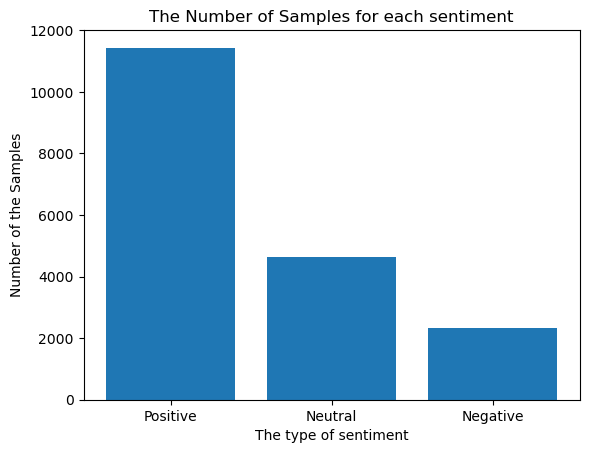

In [5]:
counting = youtube_comments.Sentiment.value_counts()
plt.bar(['Positive', 'Neutral', 'Negative'],counting)
plt.xlabel('The type of sentiment')
plt.ylabel('Number of the Samples')
plt.title("The Number of Samples for each sentiment")
plt.show()

Extracting the **'Comment'** and **'Sentiment'** columns for our analysis

In [6]:
# Extracting Comment & Sentiment columns
First_corpus = pd.DataFrame(columns=['Text','Label'])
First_corpus['Text'],First_corpus['Label'] = youtube_comments['Comment'],youtube_comments['Sentiment']

We will be doing *Binary Classification* for our dataset, hence we will drop the **Neutral Sentiment**.

In [7]:
# Dropping the Neutral Sentiment rows
First_corpus.drop(First_corpus[First_corpus['Label'] == 1.0].index, inplace=True)
# Assigning the Positive class (2.0) to (1.0)
First_corpus.loc[First_corpus['Label'] == 2.0, 'Label'] = 1.0

### 2.3 Analyzing youtube statistics dataset

In [8]:
#displaying top 40 rows of our processed corpus file
First_corpus.head(40)

,Text,Label
1,Here in NZ 50% of retailers don’t even have co...,0.0
2,I will forever acknowledge this channel with t...,1.0
3,Whenever I go to a place that doesn’t take App...,0.0
4,"Apple Pay is so convenient, secure, and easy t...",1.0
6,We only got Apple Pay in South Africa in 2020/...,1.0
8,"In the United States, we have an abundance of ...",1.0
10,"Wow, you really went to town on the PSU test r...",1.0
11,The lab is the most exciting thing in IT I've ...,1.0
12,"Linus, I'm an engineer and love the LMG conten...",1.0
13,There used to be a time where Linus was the sm...,1.0


In [22]:
First_corpus.Text.describe()

count                                                 13770
unique                                                13462
top       One of the best thing about Dude is that he\r\...
freq                                                     10
Name: Text, dtype: object

There are some **DUPLICATED TEXTS**, hence, we will drop them as well as **NULL VALUES**, if any.

In [23]:
First_corpus.drop_duplicates(inplace=True)
print(First_corpus.Text.is_unique)
print(f'Number of Samples after removing duplicates: {len(First_corpus)}')

True
Number of Samples after removing duplication: 13462


In [24]:
First_corpus.dropna(inplace=True)
print(f'Number of Samples after removing null values: {len(First_corpus)}')

Number of Samples after removing null values: 13462


In [25]:
# To display Label Count and Total Number of Samples
df = First_corpus
print(df.Label.value_counts())
print(f'The number of total samples: {len(df)}')
df.head(10)

Label
1.0    11141
0.0     2321
Name: count, dtype: int64
The number of total samples after concatenating: 13462


,Text,Label
1,Here in NZ 50% of retailers don’t even have co...,0.0
2,I will forever acknowledge this channel with t...,1.0
3,Whenever I go to a place that doesn’t take App...,0.0
4,"Apple Pay is so convenient, secure, and easy t...",1.0
6,We only got Apple Pay in South Africa in 2020/...,1.0
8,"In the United States, we have an abundance of ...",1.0
10,"Wow, you really went to town on the PSU test r...",1.0
11,The lab is the most exciting thing in IT I've ...,1.0
12,"Linus, I'm an engineer and love the LMG conten...",1.0
13,There used to be a time where Linus was the sm...,1.0


Analyzing the *distribution* of the dataset classes {Positive, Negative} to check if the data is balanced or imbalanced.

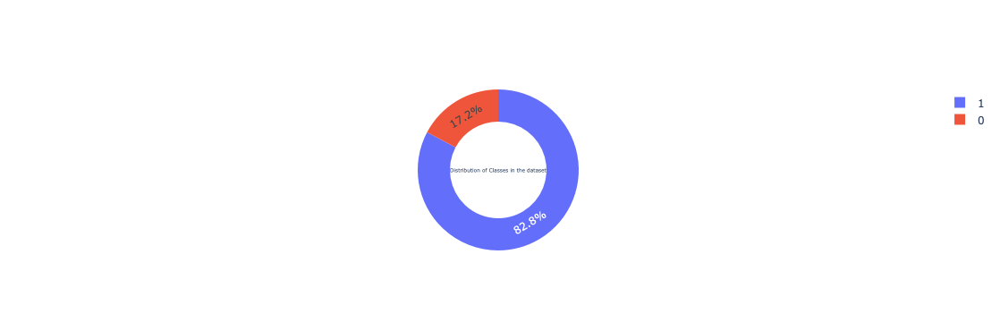

In [26]:
labels = df.groupby(df['Label']).size().index
values = df.groupby(df['Label']).size().values
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.6,title='Distribution of Classes in the dataset')])
fig.show()

## 3. Data Preparation & Cleaning

In [27]:
print(f"The total number of samples after dropping some {len(df)}")

The total number of samples 13462
The total number of samples after dropping some 13462


As our dataset incorporates *Social Media comments* for training our model, our corpus may contain **Mentions @**, **Hashtags #**, **Emojies and Flags**, **Links & URLs**, **Symbols**, **Digits which is useless at our problem**, **Duplicated characters within the same word** and **Abbreviations**

In [28]:
#Defining a function that remove unnecessary characters
def cleaning(text):
    text = re.sub(r'#\w+','', text)                 # Removing Hashtags
    text = re.sub(r'http\S+','', text)              # Removing Links & URLs
    text = re.sub(r'@\w+','', text)                 # Removing Mentions
    text = re.sub('[()!?.\';:<>`$%’,]', '', text)   # Removing Punctuations with different forms
    text = re.sub(r'[^a-zA-Z]',' ', text)           # Removing digits
    text = re.sub(r'([a-zA-Z])\1{2,}','\1', text)   # Reduce duplicated character (> 3) to only one
    return text

# Defining list of Abbreviations to be expanded to its original form
abbreviations = {'fyi': 'for your information',
                 'lol': 'laugh out loud',
                 'loza': 'laughs out loud',
                 'lmao': 'laughing',
                 'rofl': 'rolling on the floor laughing',
                 'vbg': 'very big grin',
                 'xoxo': 'hugs and kisses',
                 'xo': 'hugs and kisses',
                 'brb': 'be right back',
                 'tyt': 'take your time',
                 'thx': 'thanks',
                 'abt': 'about',
                 'bf': 'best friend',
                 'diy': 'do it yourself',
                 'faq': 'frequently asked questions',
                 'fb': 'facebook',
                 'idk': 'i don\'t know',
                 'asap': 'as soon as possible',
                 'syl': 'see you later',
                 'nvm': 'never mind',
                 'frfr':'for real for real',
                 'istg':'i swear to god',
    }

In [29]:
# Putting all together
def DataCleaning(corpus):
    corpus['Text'] = corpus['Text'].apply(cleaning)     # Calling cleaning function (1-7)
    corpus['Text'] = corpus['Text'].str.lower()         # Normalize all characters to lowercase
    for abbreviation, full_form in abbreviations.items(): # Expanding the Abbreviations
        corpus['Text'] = corpus['Text'].str.replace(abbreviation, full_form)
    return corpus

In [30]:
df = DataCleaning(df)

In [31]:
print(f"The total number of samples: {len(df)}")
df.drop_duplicates(inplace=True)                # Dropping duplicated texts if exist after Cleaning
df.dropna(inplace=True)                         # Dropping Null values if exist after Cleaning
print(f"The total number of samples after removal: {len(df)}")

The total number of samples: 13462
The total number of samples after removal: 13359


In [32]:
df.Text.describe()

count     13359
unique    13358
top            
freq          2
Name: Text, dtype: object

Using **WordCloud** the most frequent words at *The whole dataset, for positive class and for the negative class* will be shown .

(-0.5, 1999.5, 1599.5, -0.5)

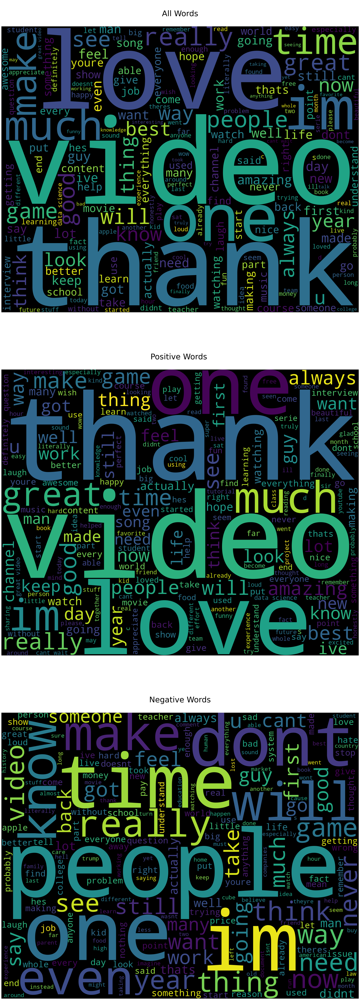

In [33]:
fig, ax = plt.subplots(3, 1, figsize  = (90,90))
all_words = WordCloud(
                          background_color='black',
                          width=2000,
                          height=1600
                         ).generate(' '.join(df['Text']))

positive_words =WordCloud(
                          background_color='black',
                          width=2000,
                          height=1600
                         ).generate(" ".join(df[df['Label']==1.0]['Text']))

negative_words =WordCloud(
                          background_color='black',
                          width=2000,
                          height=1600
                         ).generate(" ".join(df[df['Label']==0.0]['Text']))

ax[0].imshow(all_words)
ax[0].set_title('\nAll Words\n', fontsize=40)
ax[0].axis('off')
print('\n')
ax[1].imshow(positive_words)
ax[1].set_title('\nPositive Words \n',fontsize=40)
ax[1].axis('off')
print('\n')
ax[2].imshow(negative_words)
ax[2].set_title('\nNegative Words\n',fontsize=40)
ax[2].axis('off')

# 4. Data Preprocessing

## 4.1 Removing Stop Words

Since the stopwords has no effect at our problem, it will be removed using **remove_stopwords function from gensim library (for wide range of stop words)**

In [34]:
df['Text'] = df['Text'].apply(remove_stopwords)

## 4.2 Tokenization

Basic tokenization will be applied to the dataset, **Using word_tokenize from nltk library**

In [35]:
df['Tokenized'] = df['Text'].apply(word_tokenize)

## 4.3 Lemmatization with POS

Using lemmatization technique with Part-of-Speech (POS) to reduce the words to its original form, depend on the where the word is !

This technique especially to make sure that every word is reduced to its equivalent correct form, rather than using Normal Lemmatization .

In [36]:
# Defining all Required Paramaters for WordNet Lemmatizer (POS Tags Reducing - POS Tagging)
lemmatizer = WordNetLemmatizer()
# pos_tagger function to Reduce Nouns to N, Adjectives to J ... etc , for further processing
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:         
        return None
    
def lemmatization(text):
    new_sen = []
    pos_tagged = pos_tag(text)
    wordnet_tagged = list(map(lambda x: (x[0],pos_tagger(x[1])), pos_tagged)) # POS Tagging & Reducing
    for word, tag in wordnet_tagged:
        if tag is None:
            new_sen.append(word)
        else:
            new_sen.append(lemmatizer.lemmatize(word,tag))                   # Lemmatizing
            
    return new_sen

In [37]:
# Lemmatizing the Corpus
df['Tokenized'] = df['Tokenized'].apply(lemmatization)

In [38]:
# Regrouping the Words into sentences to detect if there is any duplication or Null Values
df['Text'] = df['Tokenized'].apply(lambda x: " ".join(x))
print(f"The total number of samples: {len(df)}")
df.Text.drop_duplicates(inplace=True)
df.Text.dropna(inplace=True)
print(f"The total number of samples after dropping: {len(df)}")

The total number of samples: 13359
The total number of samples after dropping: 13359


The dataset now is ready to be vectorized (**NEXT STAGE**)

# 5. Data Representation & Vectorization

## 5.1 TF-IDF Vectorization

For our problem, i.e. Sentiment Analysis & Classification, the most appropriate representation would be TF-IDF Vectorizer, it provide more accurate correlation between words (Features) and how they are appeard within the whole corpus.

> The results of this work show that calculating the TF-IDF score of the corpus allows for a more accurate representation of the overall polarity since terms are given a weight based on their uniqueness and relevance rather than just the frequency at which they appear in the corpus.

[Sentiment Analysis on Twitter Data Using Term Frequency-Inverse Document Frequency](https://www.scirp.org/journal/paperinformation.aspx?paperid=119519)

In [39]:
# For more accurate vectorizing, the Vectorizer has specified as the following
# strip_accents: if any symbols/emojies or any character that is not encoded in ASCII will be removed
# analyzer: the tokenization process will be re-applied as words -if chars are detected will not be taken-
# smooth_idf: later in evaluation/testing, if any word doesn't exist, then the denominator of the
# TF-IDF Calculation will be 1 -to avoid dividing on zero-
# min_df: to skip any word that document frequency is less than 10 which means has less effect

vectorizer = TfidfVectorizer(strip_accents='ascii',analyzer='word',
                            smooth_idf=True, norm=None, min_df=10)
X = vectorizer.fit_transform(df['Text'])
y = df['Label'].astype('Int64')                       # To split labels and convert it to Int type

In [40]:
# To see the properties, features of the Vector X
print("The shape of the dataset:", X.shape)
print("Some of the vocabulary: ", list(vectorizer.vocabulary_.items())[:10])

The shape of the dataset: (13359, 2523)
Some of the vocabulary:  [('dont', 649), ('credit', 499), ('card', 304), ('machine', 1334), ('like', 1285), ('pay', 1591), ('wave', 2433), ('support', 2178), ('apple', 114), ('high', 1045)]


There are 20958 features which is still huge number of features at the Vocabulary, it can be reduced in the Next Stage

# 6. Modeling & Training

## 6.1 Splitting data for Training & Testing

In [41]:
# The training size will be 70% and test size is 30%
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30, shuffle=True, random_state=41)

In [42]:
# We will use some metrics to compare the evaluation performance of the models later
result = pd.DataFrame(columns=['Model Name','Accuracy','Precision Score','Recall Score','F1-Score'])

## 6.2 Random Forest Classifier
The hyperparameters will be tuning in order to get the best number of n_estimator that could affects the accuracy

In [43]:
# Hyperparameter Tuning for n_estimator to Random Forest Classifier
t_result = []
for i in range(1,11):
    RF = RandomForestClassifier(n_estimators=i, criterion='entropy', n_jobs=-1)
    RF.fit(X_train,y_train)
    prediction = RF.predict(X_train)
    t_result.append((i,accuracy_score(y_train,prediction), precision_score(y_train,prediction), 
                    recall_score(y_train,prediction), f1_score(y_train,prediction)))

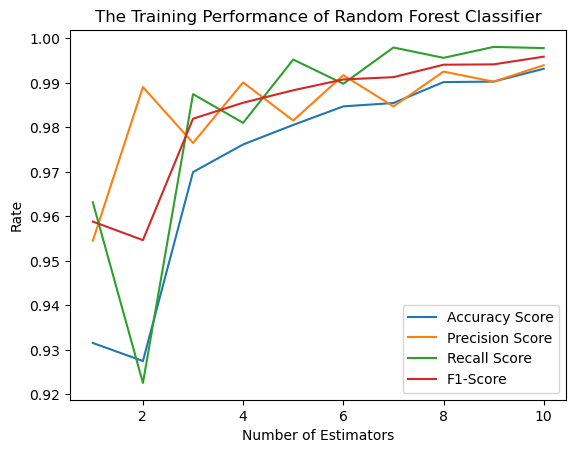

In [44]:
# Plotting the Training Performance
result_df = pd.DataFrame(t_result, columns=['num. of estimator', 'Accuracy', 'Precision','Recall',
                                          'F1-score'])
plt.plot(result_df['num. of estimator'], result_df['Accuracy'], label = 'Accuracy Score')
plt.plot(result_df['num. of estimator'], result_df['Precision'], label = 'Precision Score')
plt.plot(result_df['num. of estimator'], result_df['Recall'], label = 'Recall Score')
plt.plot(result_df['num. of estimator'], result_df['F1-score'], label = 'F1-Score')
plt.xlabel("Number of Estimators")
plt.ylabel("Rate")
plt.title("The Training Performance of Random Forest Classifier")
plt.legend()
plt.show()

In [45]:
# Training the RF on 10 estimator for best performance
RF = RandomForestClassifier(n_estimators= 10, criterion='entropy', n_jobs=-1)
RF.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, n_jobs=-1)

### 6.2.1 Evaluating the Random Forest Classifier and Save results

In [46]:
prediction = RF.predict(X_test)
print(classification_report(y_test,prediction))    # Display the Testing Classification Report

              precision    recall  f1-score   support

         0.0       0.67      0.47      0.56       706
         1.0       0.89      0.95      0.92      3302

    accuracy                           0.87      4008
   macro avg       0.78      0.71      0.74      4008
weighted avg       0.85      0.87      0.86      4008



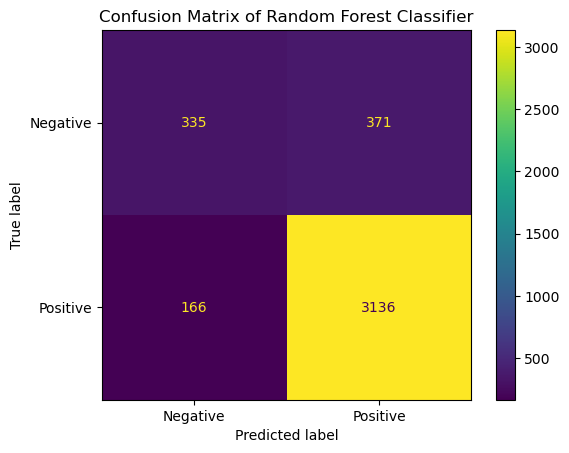

In [47]:
# Displaying the Confusion matrix of Random Forest Classifier
cm_matrix = confusion_matrix(y_test,prediction)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_matrix, display_labels = ['Negative','Positive'])
cm_display.plot()
plt.title("Confusion Matrix of Random Forest Classifier")
plt.show()

In [48]:
# Saving the evaluation Result of Random Forest Classifier
model_result = ['Random Forest Classifier',accuracy_score(y_test,prediction), 
              precision_score(y_test,prediction), recall_score(y_test,prediction),
              f1_score(y_test,prediction)]
result.loc[len(result)] = model_result

## 6.3 Logistic Regression
The hyperparameters will be tuning in order to get the best number of C Regularization that could affects the accuracy

In [49]:
# Hyperparameter Tuning for C regurlarization in order to get best training performance
t_result = []
itr = 0.1
while itr <= 1.00:
    LGR = LogisticRegression(penalty='l2', dual=False, C=itr, fit_intercept=True
                        , random_state = 41, solver = 'sag', max_iter=1000)
    LGR.fit(X_train, y_train)
    prediction = LGR.predict(X_train)
    t_result.append((itr,accuracy_score(y_train,prediction), precision_score(y_train,prediction), 
                    recall_score(y_train,prediction), f1_score(y_train,prediction)))
    itr += 0.1

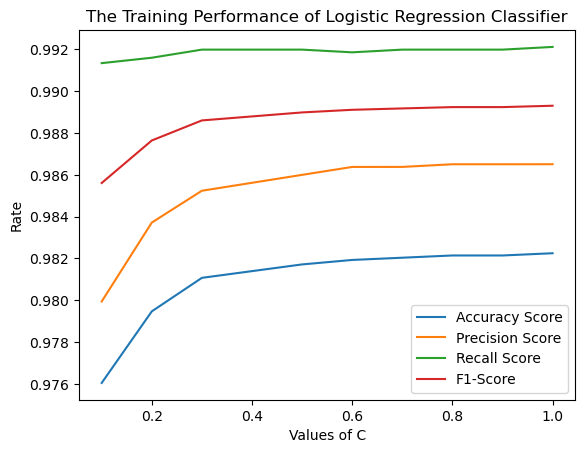

In [50]:
result_df = pd.DataFrame(t_result, columns=['C', 'Accuracy', 'Precision','Recall',
                                          'F1-score'])
plt.plot(result_df['C'], result_df['Accuracy'], label = 'Accuracy Score')
plt.plot(result_df['C'], result_df['Precision'], label = 'Precision Score')
plt.plot(result_df['C'], result_df['Recall'], label = 'Recall Score')
plt.plot(result_df['C'], result_df['F1-score'], label = 'F1-Score')
plt.xlabel("Values of C")
plt.ylabel("Rate")
plt.title("The Training Performance of Logistic Regression Classifier")
plt.legend()
plt.show()

In [51]:
# Training the Logistic Regression for C = 0.9 for best performance
LGR = LogisticRegression(penalty='l2', dual=False, C=0.9, fit_intercept=True
                        , random_state = 41, solver = 'sag', max_iter=1000)
LGR.fit(X_train, y_train)

LogisticRegression(C=0.9, max_iter=1000, random_state=41, solver='sag')

### 6.3.1 Evaluating The Logistic Regressions and Save Results

In [52]:
prediction = LGR.predict(X_test)
print(classification_report(y_test,prediction))    # Display the Testing Classification Report

              precision    recall  f1-score   support

         0.0       0.68      0.64      0.66       706
         1.0       0.92      0.93      0.93      3302

    accuracy                           0.88      4008
   macro avg       0.80      0.79      0.79      4008
weighted avg       0.88      0.88      0.88      4008



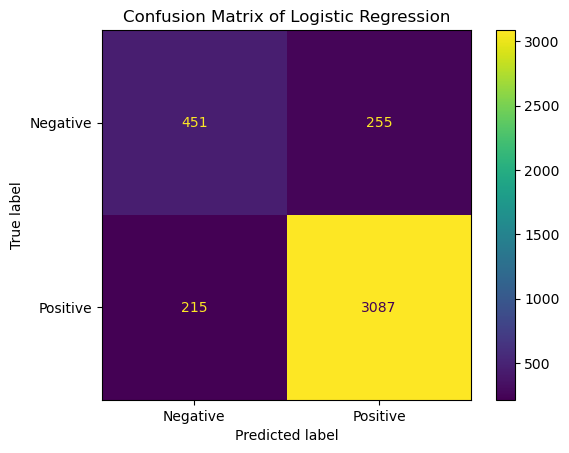

In [53]:
# Displaying the Confusion matrix of Logistic Regression
cm_matrix = confusion_matrix(y_test,prediction)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_matrix, display_labels = ['Negative','Positive'])
cm_display.plot()
plt.title("Confusion Matrix of Logistic Regression")
plt.show()

In [54]:
# Saving the evaluation Result of Logistic Regresion
model_result = ['Logistic Regression',accuracy_score(y_test,prediction), 
              precision_score(y_test,prediction), recall_score(y_test,prediction),
              f1_score(y_test,prediction)]
result.loc[len(result)] = model_result

## 6.4 Multinomial Naive Bayes

The Multinomial Naive Bayes will be used since it is suitable for TF-IDF counts, there is not too much parameters to adjust, so a basic MultinomialNB will be used .

> The multinomial Naive Bayes classifier is suitable for classification with discrete features (e.g., word counts for text classification). The multinomial distribution normally requires integer feature counts. However, in practice, fractional counts such as tf-idf may also work.

[sklearn.naive_bayes.MultinomialNB](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html)

In [55]:
NB = MultinomialNB()
NB.fit(X_train,y_train)

MultinomialNB()

In [56]:
print("\t\tThe Training Classification Report")
prediction = NB.predict(X_train)
print(classification_report(y_train,prediction))    # Display the Training Classification Report
print('\n')
print("\t\tThe Evaluation Classification Report")
prediction = NB.predict(X_test)
print(classification_report(y_test,prediction))    # Display the Testing Classification Report

		The Training Classification Report
              precision    recall  f1-score   support

         0.0       0.68      0.85      0.76      1614
         1.0       0.97      0.92      0.94      7737

    accuracy                           0.91      9351
   macro avg       0.82      0.88      0.85      9351
weighted avg       0.92      0.91      0.91      9351



		The Evaluation Classification Report
              precision    recall  f1-score   support

         0.0       0.59      0.70      0.64       706
         1.0       0.93      0.89      0.91      3302

    accuracy                           0.86      4008
   macro avg       0.76      0.80      0.77      4008
weighted avg       0.87      0.86      0.86      4008



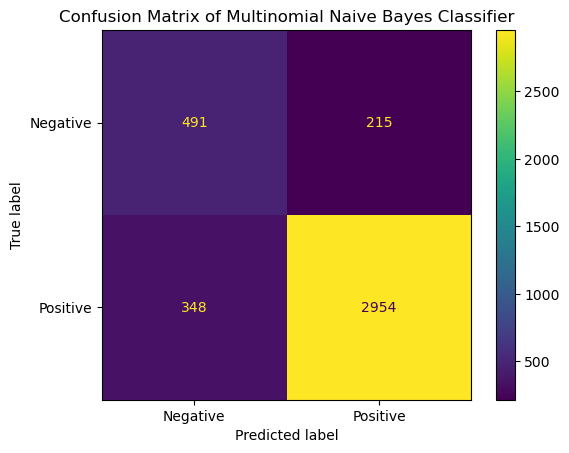

In [57]:
# Displaying the Confusion matrix of Multinomial Naive Bayes
cm_matrix = confusion_matrix(y_test,prediction)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_matrix, display_labels = ['Negative','Positive'])
cm_display.plot()
plt.title("Confusion Matrix of Multinomial Naive Bayes Classifier")
plt.show()

In [58]:
# Saving the evaluation Result of Multinomial Naive Bayes
model_result = ['MultinomialNB',accuracy_score(y_test,prediction), 
              precision_score(y_test,prediction), recall_score(y_test,prediction),
              f1_score(y_test,prediction)]
result.loc[len(result)] = model_result

## 6.5 Decision Tree Classifier

In [59]:
# basic hyperparameters is chosen for the DTClassifier, with entropy criterion
DT = DecisionTreeClassifier(criterion='entropy', max_features='sqrt')
DT.fit(X_train,y_train)
prediction = DT.predict(X_train)           # Training Performance will be measured

In [60]:
print("\t\tThe Training Classification Report")
prediction = DT.predict(X_train)
print(classification_report(y_train,prediction))    # Display the Training Classification Report
print('\n')
print("\t\tThe Evaluation Classification Report")
prediction = DT.predict(X_test)
print(classification_report(y_test,prediction))    # Display the Testing Classification Report

		The Training Classification Report
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      1614
         1.0       1.00      1.00      1.00      7737

    accuracy                           1.00      9351
   macro avg       1.00      1.00      1.00      9351
weighted avg       1.00      1.00      1.00      9351



		The Evaluation Classification Report
              precision    recall  f1-score   support

         0.0       0.49      0.53      0.51       706
         1.0       0.90      0.88      0.89      3302

    accuracy                           0.82      4008
   macro avg       0.69      0.70      0.70      4008
weighted avg       0.82      0.82      0.82      4008



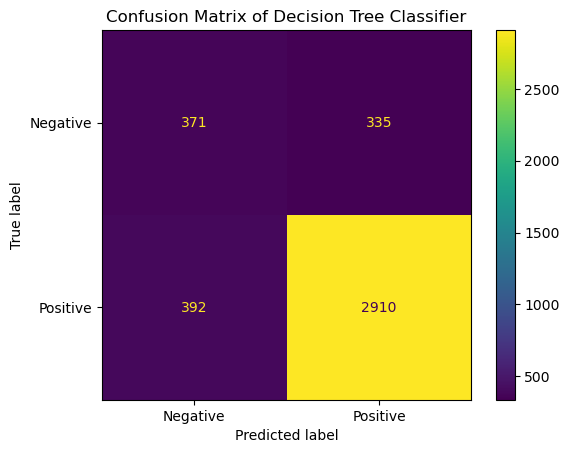

In [61]:
# Displaying the Confusion matrix of Decision Tree Classifier
cm_matrix = confusion_matrix(y_test,prediction)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_matrix, display_labels = ['Negative','Positive'])
cm_display.plot()
plt.title("Confusion Matrix of Decision Tree Classifier")
plt.show()

In [62]:
# Saving the evaluation Result of DecisionTreeClassifier
model_result = ['DecisionTree',accuracy_score(y_test,prediction), 
              precision_score(y_test,prediction), recall_score(y_test,prediction),
              f1_score(y_test,prediction)]
result.loc[len(result)] = model_result

## 6.6 Linear Support-Vector Classifier

As the same for Logistic Regression, the HyperParameter C will be tuned to get possible best result

In [63]:
# Hyperparameter Tuning for C regurlarization in order to get best training performance
t_result = []
itr = 0.1
while itr <= 1.00:
    LSVC = LinearSVC(penalty='l2',dual=False, C=itr)
    LSVC.fit(X_train,y_train)
    prediction = LSVC.predict(X_train)
    t_result.append((itr,accuracy_score(y_train,prediction), precision_score(y_train,prediction), 
                    recall_score(y_train,prediction), f1_score(y_train,prediction)))
    itr += 0.1

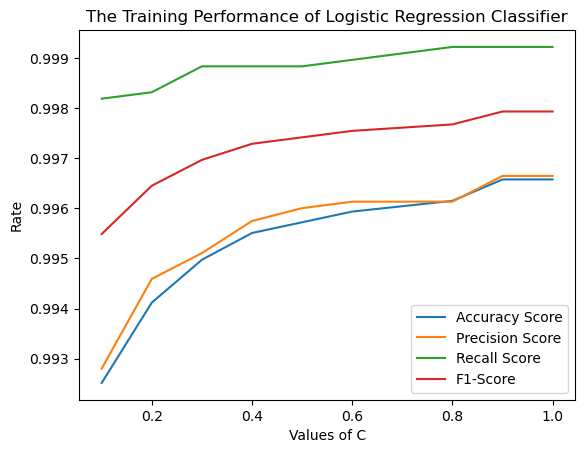

In [64]:
# Displaying the training performance
result_df = pd.DataFrame(t_result, columns=['C', 'Accuracy', 'Precision','Recall',
                                          'F1-score'])
plt.plot(result_df['C'], result_df['Accuracy'], label = 'Accuracy Score')
plt.plot(result_df['C'], result_df['Precision'], label = 'Precision Score')
plt.plot(result_df['C'], result_df['Recall'], label = 'Recall Score')
plt.plot(result_df['C'], result_df['F1-score'], label = 'F1-Score')
plt.xlabel("Values of C")
plt.ylabel("Rate")
plt.title("The Training Performance of Logistic Regression Classifier")
plt.legend()
plt.show()

Looks like it is Stable !

In [65]:
# Training the Linear SVC for C = 0.9 for best performance
LSVC = LinearSVC(penalty='l2',dual=False, C=0.9)
LSVC.fit(X_train,y_train)

LinearSVC(C=0.9, dual=False)

### 6.6.1 Evaluating The Linear Support-Vector Classifier and Save Results

In [66]:
prediction = LSVC.predict(X_test)
print(classification_report(y_test,prediction))    # Display the Testing Classification Report

              precision    recall  f1-score   support

         0.0       0.58      0.63      0.60       706
         1.0       0.92      0.90      0.91      3302

    accuracy                           0.85      4008
   macro avg       0.75      0.77      0.76      4008
weighted avg       0.86      0.85      0.86      4008



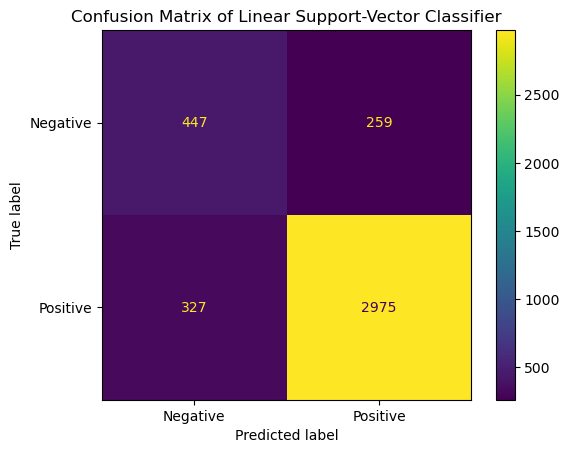

In [67]:
# Displaying the Confusion matrix of Linear SVC
cm_matrix = confusion_matrix(y_test,prediction)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm_matrix, display_labels = ['Negative','Positive'])
cm_display.plot()
plt.title("Confusion Matrix of Linear Support-Vector Classifier")
plt.show()

In [68]:
# Saving the evaluation Result of Linear SVC
model_result = ['Linear SVC',accuracy_score(y_test,prediction), 
              precision_score(y_test,prediction), recall_score(y_test,prediction),
              f1_score(y_test,prediction)]
result.loc[len(result)] = model_result

# 7. Evaluation & Comparison

In [69]:
# First, Displaying the DataFrame contains the Testing Performance of each Model
result

,Model Name,Accuracy,Precision Score,Recall Score,F1-Score
0,Random Forest Classifier,0.866018,0.894212,0.949727,0.921134
1,Logistic Regression,0.882735,0.923698,0.934888,0.929259
2,MultinomialNB,0.859531,0.932155,0.894609,0.912996
3,DecisionTree,0.818613,0.896764,0.881284,0.888957
4,Linear SVC,0.853792,0.919913,0.900969,0.910343


## 7.1 Comparison based on Accuracy

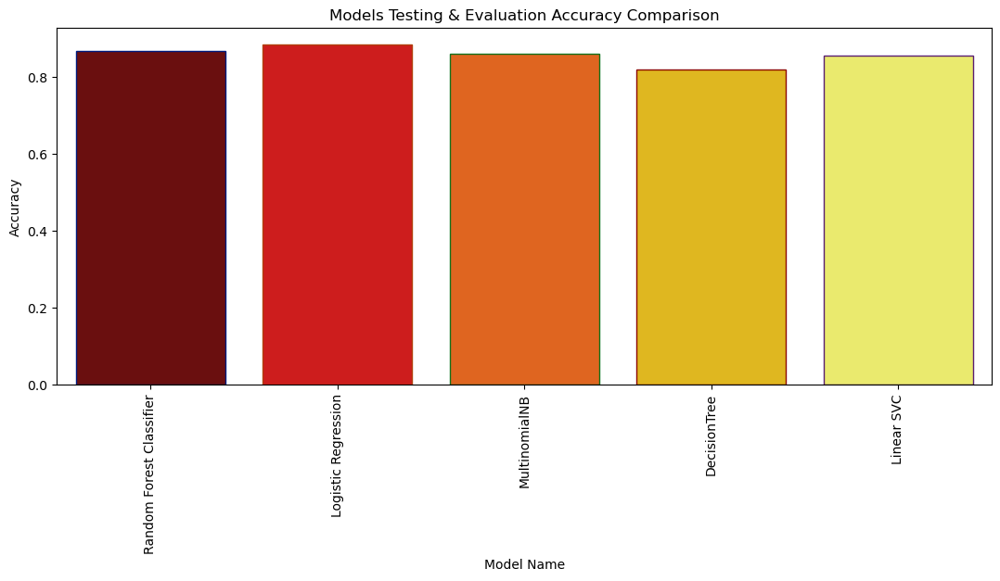

In [70]:
# Displaying a bar to compare between Models according to their Accuracy
plt.subplots(figsize=(13,5))
sns.barplot(x="Model Name", y="Accuracy",data=result,palette='hot',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Models Testing & Evaluation Accuracy Comparison')
plt.show()

## 7.2 Comparison based on Precision

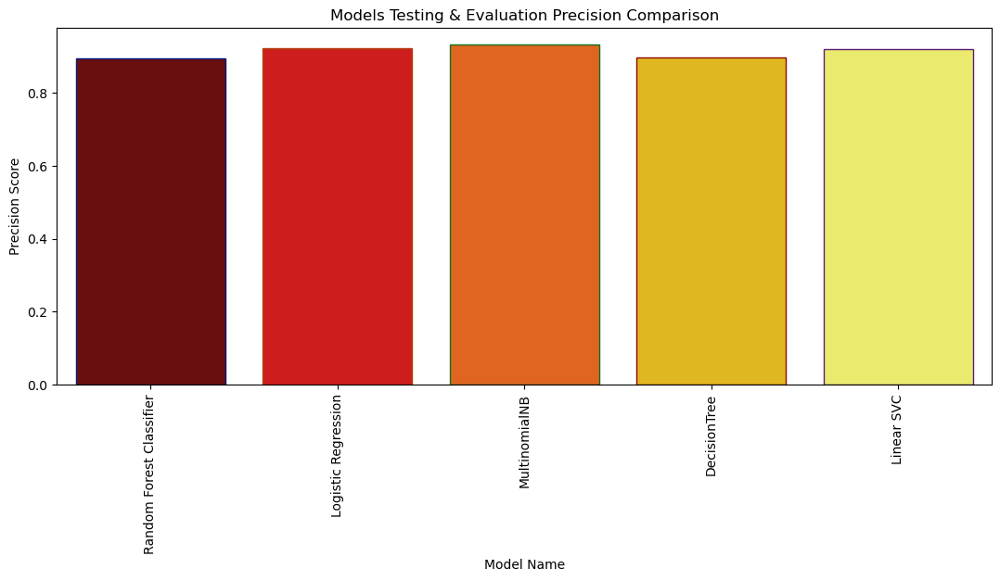

In [71]:
# Displaying a bar to compare between Models according to their Precision
plt.subplots(figsize=(13,5))
sns.barplot(x="Model Name", y="Precision Score",data=result,palette='hot',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Models Testing & Evaluation Precision Comparison')
plt.show()

## 7.3 Comparison based on Recall

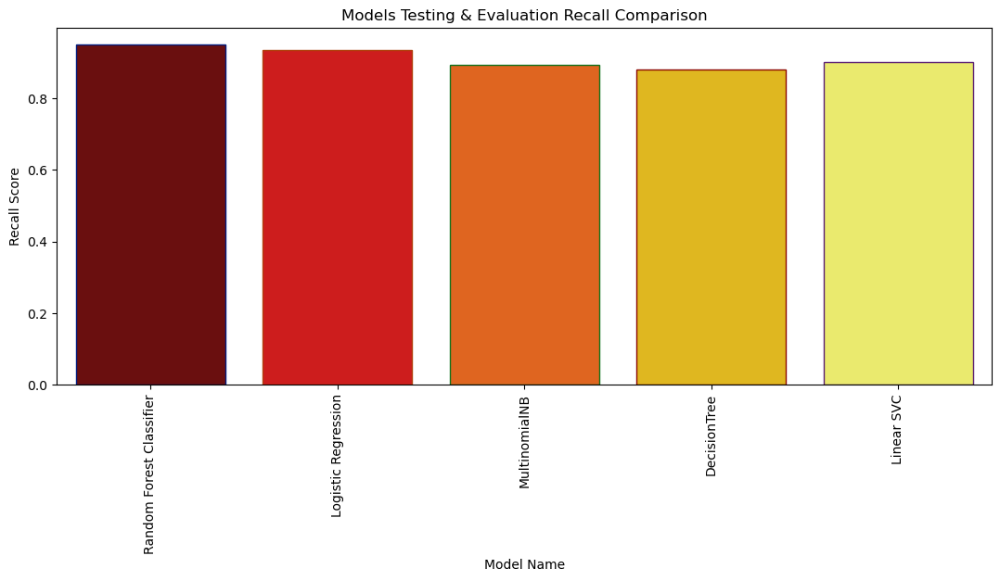

In [72]:
# Displaying a bar to compare between Models according to their Recall
plt.subplots(figsize=(13,5))
sns.barplot(x="Model Name", y="Recall Score",data=result,palette='hot',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Models Testing & Evaluation Recall Comparison')
plt.show()

## 7.4 Comparison based on F1-Score

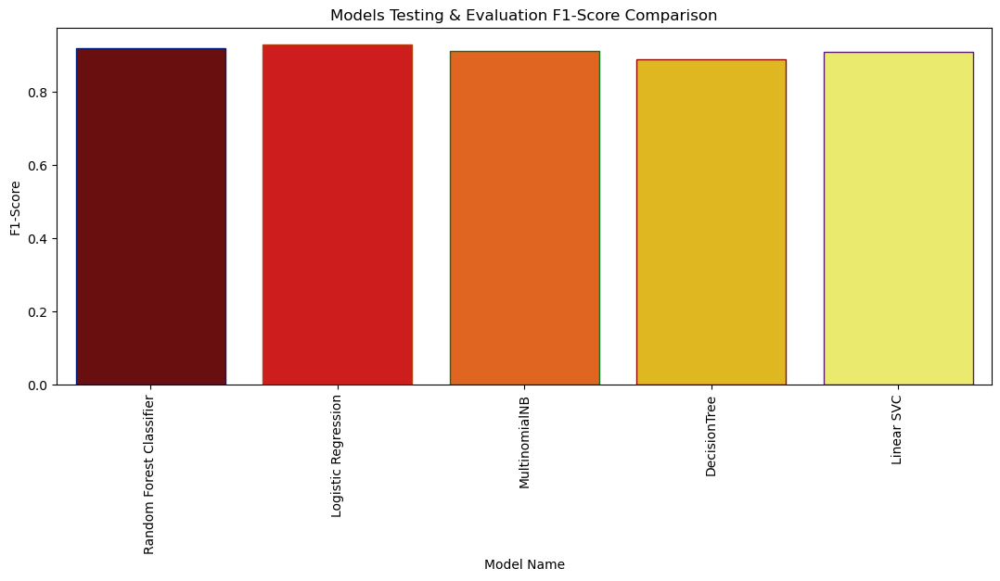

In [73]:
# Displaying a bar to compare between Models according to their F1-score
plt.subplots(figsize=(13,5))
sns.barplot(x="Model Name", y="F1-Score",data=result,palette='hot',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Models Testing & Evaluation F1-Score Comparison')
plt.show()

The Logistic Regression Classifier looks stable and providing the **BEST** evaluation performance, adding to its training perfromance displayed before.

So, we are on our way to use Logistic Regression Classifier for our Problem .

In [74]:
# Putting All together in Pipeline
LGR_pipe = Pipeline([('vectorizer',vectorizer),('LGR',LGR)])

# Saving the Pipeline for Later using
pickle.dump(LGR_pipe, open('LGR_Model.sav', 'wb'))

# 8. Trying & Testing

In [77]:
LGR_Model = pickle.load(open('LGR_Model.sav','rb'))           # Loading our model
Sentence = 'Kaggle is the most wonderful platforms ever !'    # The sentence to be tested

# Firstly Preprocess the sentence
lower_sen = Sentence.lower()                                  # Lowering all characters
cleaned_sentence = remove_stopwords(lower_sen)                # Removing Stop Words
tken_sentence = word_tokenize(cleaned_sentence)               # Tokenizing to be Lemmatized
lemmatized_sen = lemmatization(tken_sentence)                 # Lemmatization with POS
processed_sen = ' '.join(lemmatized_sen)                      # Regrouping

# Display the Sentence
print(processed_sen)

# Go through the Pipeline (Vectorizing & Predict)
sentiment = LGR_Model.predict([processed_sen])
if sentiment[0] == 1:
    print(Sentence, '(is Positive)')
else:
    print(Sentence, '(is Negative)')

kaggle bad platform !
Kaggle is a bad platforms ever ! (is Negative)


It seems to be worked very well :)